In [1]:
import gym
import numpy as np
from numpngw import write_apng
from IPython.display import Image

import importlib
import assistive_gym
from assistive_gym.learn import train, render_policy, evaluate_policy


/home/longpml/miniconda3/envs/assistive/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/home/longpml/miniconda3/envs/assistive/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/home/longpml/miniconda3/envs/assistive/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/home/longpml/miniconda3/envs/a

In [2]:
from matplotlib import pyplot as plt
import cv2

In [3]:
ENV_NAME = 'FeedingSawyerHuman-v1'
COOP = True

ALGO = 'ppo'
TIMESTEPS_TOTAL = 2e6
SAVE_DIR = './trained_models/'


In [4]:
# !python3 -m ppo.enjoy_coop --env-name "FeedingSawyerHuman-v0"

In [5]:
# Train model
# policy_path = train(
#     env_name=ENV_NAME, algo=ALGO, timesteps_total=TIMESTEPS_TOTAL, 
#     coop=COOP,
#     save_dir=SAVE_DIR, load_policy_path='',
#     )


# Resume train
# policy_path = "trained_models/ppo/FeedingSawyerHuman-v1/checkpoint_000083/checkpoint-83"
# policy_path = train(
#     env_name=ENV_NAME, algo=ALGO, timesteps_total=TIMESTEPS_TOTAL, 
#     coop=COOP,
#     save_dir=SAVE_DIR, load_policy_path=policy_path,
#     )



In [6]:
# python3 -m assistive_gym.learn --env "FeedingSawyerHuman-v1" --algo ppo --render --seed 0 --load-policy-path ./trained_models/ --render-episodes 10!

In [7]:
# if not COOP:
#     env = gym.make('assistive_gym:'+ENV_NAME)
# else:
#     module = importlib.import_module('assistive_gym.envs')
#     env_class = getattr(module, ENV_NAME.split('-')[0] + 'Env')
#     env = env_class()

from assistive_gym.envs import FeedingSawyerHumanEnv
env = FeedingSawyerHumanEnv()

env.setup_camera(camera_eye=[0.5, -0.75, 1.5], camera_target=[-0.2, 0, 0.75], fov=60, camera_width=1920//4, camera_height=1080//4)

checkpoint = "000105"
policy_path = f"trained_models/ppo/FeedingSawyerHuman-v1/checkpoint_{checkpoint}/checkpoint-{int(checkpoint)}"

render_policy(env=env, env_name=ENV_NAME, algo=ALGO, policy_path=policy_path, coop=True, colab=True, seed=0)



pybullet build time: May 31 2024 08:29:44


Using TensorFlow backend.


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where



2024-06-04 13:55:59,528	INFO trainer.py:2333 -- Your framework setting is 'tf', meaning you are using static-graph mode. Set framework='tf2' to enable eager execution with tf2.x. You may also then want to set eager_tracing=True in order to reach similar execution speed as with static-graph mode.
2024-06-04 13:55:59,530	INFO ppo.py:415 -- In multi-agent mode, policies will be optimized sequentially by the multi-GPU optimizer. Consider setting simple_optimizer=True if this doesn't work for you.
2024-06-04 13:55:59,530	INFO trainer.py:906 -- Current log_level is ERROR. For more information, set 'log_level': 'INFO' / 'DEBUG' or use the -v and -vv flags.
2024-06-04 13:56:17,110	INFO trainable.py:163 -- Trainable.setup took 17.584 seconds. If your trainable is slow to initialize, consider setting reuse_actors=True to reduce actor creation overheads.
2024-06-04 13:56:17,451	INFO trainable.py:589 -- Restored on 192.168.0.125 from checkpoint: trained_models/ppo/FeedingSawyerHuman-v1/checkpoint_

'output_FeedingSawyerHuman-v1.avi'

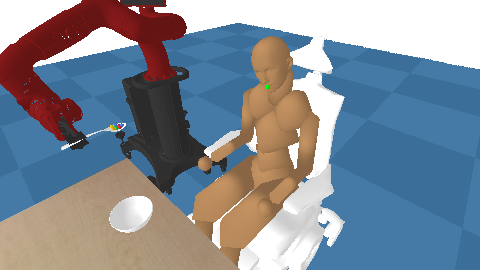

In [11]:
from IPython.display import Image
Image(filename='output_%s.png' % ENV_NAME)

In [34]:
# observation = env.reset()
# frames = []
# done = False
# while not done:
#     # Step the simulation forward. Have the robot take a random action.
#     observation, reward, done, info = env.step(env.action_space.sample())
#     # Capture (render) an image from the camera
#     img, depth = env.get_camera_image_depth()
#     frames.append(img.astype(np.uint8))

# # Compile the camera frames into an animated png (apng)
# write_apng('output.png', frames, delay=100)
# # Show the apng
# Image(filename='output.png')